# Practical Data Visualization with Python - Part 3: Statistical Visualization in the Wild

## Setup

In [1]:
%%capture
# capturing above because there are a few useless warnings that might pop up, version-depending

# basic packages:
import numpy as np
import pandas as pd
import datetime
from scipy import stats

# packages for viz:
# plotly express
import plotly_express as px
# matplotlib
import matplotlib.pyplot as plt
# seaborn and default seaborn settings set for matplot lib charts
import seaborn as sns; sns.set()
# base plotly packages
import plotly.figure_factory as ff
import plotly.io as pio
from plotly.offline import plot, iplot, init_notebook_mode
from plotly.subplots import make_subplots
# turns on plotly notebook mode
init_notebook_mode()
from plotly import graph_objs as go
# altair
import altair as alt
# turns on altair renderer -- jlab is default
alt.renderers.enable('jupyterlab')
# bokeh
from bokeh.plotting import figure, show, output_file, save
from bokeh.io import output_notebook
# plotnine
from plotnine import *

In [2]:
# there are a few warnings I want to silence throughout that are due to unimportant np deprecations 
np.warnings.filterwarnings('ignore')

In [3]:
# store the datetime of the most recent running of this notebook as a form of a log
most_recent_run_datetime = datetime.datetime.now().strftime("%Y-%m-%d %H:%M")
f"This notebook was last executed on {most_recent_run_datetime}"

'This notebook was last executed on 2019-08-08 18:29'

In [4]:
# pulling in our main data; for more info on the data, see the "data_prep_nb.ipynb" file
main_df = pd.read_csv(filepath_or_buffer='../data/jan_and_dec_17_acqs.csv')

# taking a peek at our data
main_df.head()

,loan_id,orig_chn,seller_name,orig_rt,orig_amt,orig_trm,orig_dte,frst_dte,oltv,ocltv,...,occ_stat,state,zip_3,mi_pct,product_type,cscore_c,mi_type,relocation_flg,cscore_min,orig_val
0,100020736692,B,"CALIBER HOME LOANS, INC.",4.875,492000,360,12/2017,02/2018,75,75,...,I,CA,920,NaN,FRM,NaN,NaN,N,757.0,656000.000000
1,100036136334,R,OTHER,2.750,190000,180,12/2017,01/2018,67,67,...,P,MD,206,NaN,FRM,798.0,NaN,N,797.0,283582.089552
2,100043912941,R,OTHER,4.125,68000,360,12/2017,02/2018,66,66,...,P,OH,432,NaN,FRM,NaN,NaN,N,804.0,103030.303030
3,100057175226,R,OTHER,4.990,71000,360,12/2017,02/2018,95,95,...,P,NC,278,30.0,FRM,NaN,1.0,N,696.0,74736.842105
4,100060715643,R,OTHER,4.500,180000,360,12/2017,02/2018,75,75,...,I,WA,983,NaN,FRM,NaN,NaN,N,726.0,240000.000000


## Statistical Visualization in the Wild

Having explored some of the vast menu of libraries available to us when building visualizations with python, let's see how we might approach a larger business question by combining statistical techniques with visualization. 

Imagine that your team has received a request from a business partner asking for your help in understanding how [debt-to-income (DTI) ratios](https://www.consumerfinance.gov/ask-cfpb/what-is-a-debt-to-income-ratio-why-is-the-43-debt-to-income-ratio-important-en-1791/) have changed over the course of 2017. While it might be optimal to make use of data from the full 2017 calendar year here, for the sake of this example, we'll stick with the same data we've been using throughout this seminar: January and December 2017 originations. How should we proceed?

For the sake of this vignette, we'll proceed in a way similar to how we might on the job. With a decently open-ended question like this, it's best to start with some [exploratory data analysis (EDA)](https://en.wikipedia.org/wiki/Exploratory_data_analysis). Once we have built some intuition surrounding the problem by way of thoughtful EDA, we might then proceed to run some statistical tests and/or maybe build a model that will allow us to more powerfully communicate insights to our partners. Let's get to it!


### Exploratory and Observational Statistics and Visualizations.

Given that our question boils down to the evolution of DTI between January and December 2017 originations, a wise place to start out EDA journey would be to get our feet wet with some simple summary statistics. This means we'll want to start by looking at things like the mean and median DTIs in the two months of data we have, along with some measures of variance / spread. Of course, we'll want to craft visualizations along the way that intuitively communicate this information as well. Next, we'll want to try to visualize the fuller distribution of DTI beyond relying on simple summary statistics. 

Before diving into the above, we'll want to prepare the data we'll be working with for this section. While in a real-world scenario, we would of course want to consider the interplay between other variables and DTI when investigating its evolution over time, for the purpose of keeping this vignette simple, we'll restrict our analysis to purely considering DTI and origination date as our two variables of interest. 

In [5]:
# creating a dataset with just origination date and DTI to simplify our data-wrangling for this section
dti_df = (
    main_df
    # select columns of interest
    .loc[:,['orig_dte','dti']] 
    # sort by origination date so earlier values appear first (for convenience)
    .sort_values(by = 'orig_dte', ascending = True)
)

# taking a look at the data we'll be working with for this section
dti_df.head()

,orig_dte,dti
79083,01/2017,39.0
105441,01/2017,29.0
105442,01/2017,29.0
105443,01/2017,37.0
105444,01/2017,26.0


In [6]:
# describe is a helpful pandas function to get summary statistics on a dataframe...
# you can use it on a grouped dataframe as well.
dti_df.groupby('orig_dte').describe()

dti                                                  
             count       mean       std  min   25%   50%   75%   max
orig_dte                                                            
01/2017   130950.0  34.077320  9.023301  1.0  28.0  35.0  42.0  62.0
12/2017    27194.0  35.792381  9.773333  1.0  29.0  37.0  44.0  50.0

Then we can take the summary stats above and visualize them a handful of different ways. We'll show a few applicable steps for this below, some of which are purposefully redundant for the sake of showing different ways accomplishing a similar outcome. First, we'll start with three plot types taken from Seaborn:

- Box Plot [documentation here](https://seaborn.pydata.org/generated/seaborn.boxplot.html)
- Violin Plot [documentation here](https://seaborn.pydata.org/generated/seaborn.violinplot.html)
- Boxen Plot [documentation here](https://seaborn.pydata.org/generated/seaborn.boxenplot.html)
    - This one is probably the most complicated, as it presents many quantiles or "letter values"; you can read more about this chart type by taking a look at the [paper that introduced the plot type here](https://vita.had.co.nz/papers/letter-value-plot.html)

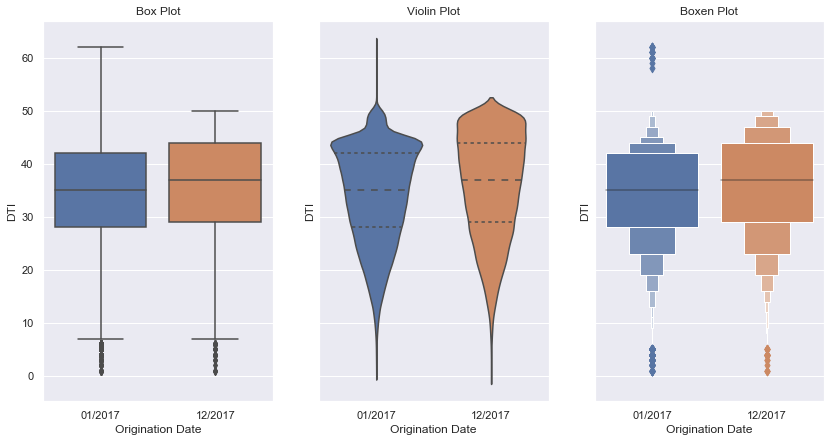

In [7]:
# creating the 3 axes for the subplots with specified size and shared y-axis
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, sharey=True, figsize=(14,7))

sns.boxplot(
    data = dti_df,
    x = 'orig_dte', 
    y = 'dti',
    # plotting to the first axis created above
    ax = ax1
)
# set the title and axis labels for the chart
ax1.set(
    title  = "Box Plot",
    xlabel = "Origination Date",
    ylabel = "DTI"
)

sns.violinplot(
    data = dti_df,     
    x = 'orig_dte', 
    y = 'dti',
    inner = 'quartile',
    # plotting to the second axis created above
    ax = ax2 
)
# set the title and axis labels for the chart
ax2.set(
    title  = "Violin Plot",
    xlabel = "Origination Date",
    ylabel = "DTI"
)

sns.boxenplot(
    data = dti_df,
    x = 'orig_dte', 
    y = 'dti',
    # plotting to the third axis created above
    ax = ax3 
)
# set the title and axis labels for the chart
ax3.set(
    title  = "Boxen Plot",
    xlabel = "Origination Date",
    ylabel = "DTI"
);

This type of simple statistical visualization is right in Seaborn's wheelhouse, but we can also build similar charts with Plotly with the added benefit of interactivity, as shown below. With Plotly, we don't yet have the ability to make a Boxen Plot, but we do have the two others:

- Base Plotly Box Plot [documentation here](https://plot.ly/python/box-plots/)
- Base Plotly Violin Plot [documentation here](https://plot.ly/python/violin/)

Note: if you look at the documentation for both of the base Plotly methods (`go.Box` and `go.Violin`), you'll see that it is actually pretty hard to color by a categorical variable (i.e. origination date) without building each color as a different trace. That is where Plotly Express comes in as very helpful, as we'll see later. 

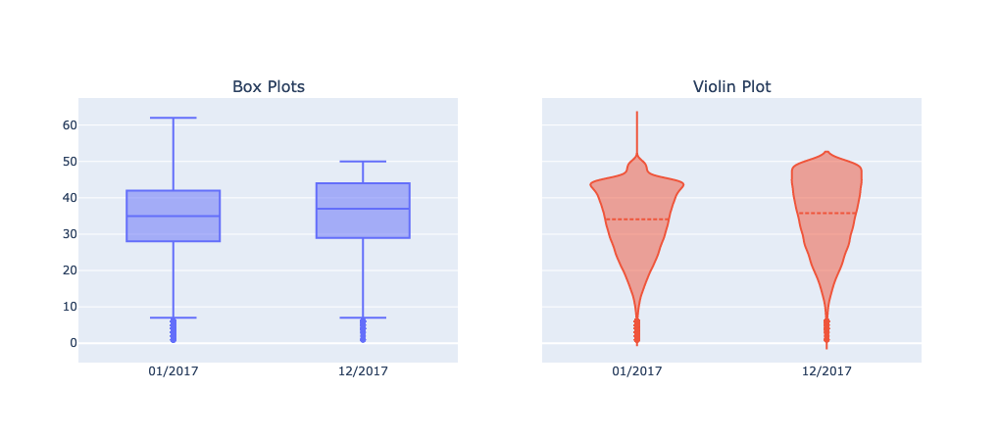

In [8]:
# create a figure space of subplots with 1 row and 2 columns
fig = make_subplots(
    rows = 1,
    cols = 2,
    subplot_titles = ("Box Plots", "Violin Plot"),
    shared_yaxes = True
)

# adding a box plot to the figure
fig.add_trace(
    go.Box(
        x = dti_df.orig_dte,
        y = dti_df.dti
    ),
    row = 1, 
    col = 1
)

# adding a violin plot to the figure
fig.add_trace(
    go.Violin(
        x = dti_df.orig_dte,
        y = dti_df.dti,
        meanline_visible = True
    ),
    row = 1, 
    col = 2
)

# dropping the legend from the output
fig.layout.update(showlegend = False)
# displaying the view in-line
fig.show()

Finally, we can build a very similar type of view via a simpler syntax courtesy of Plotly Express, as shown below. The documentation link for the `px.violin()` call is the same as those listed above. As mentioned before, note how easy it is to color by a categorical label, whereas with base Plotly one would need to do this via multiple traces. 

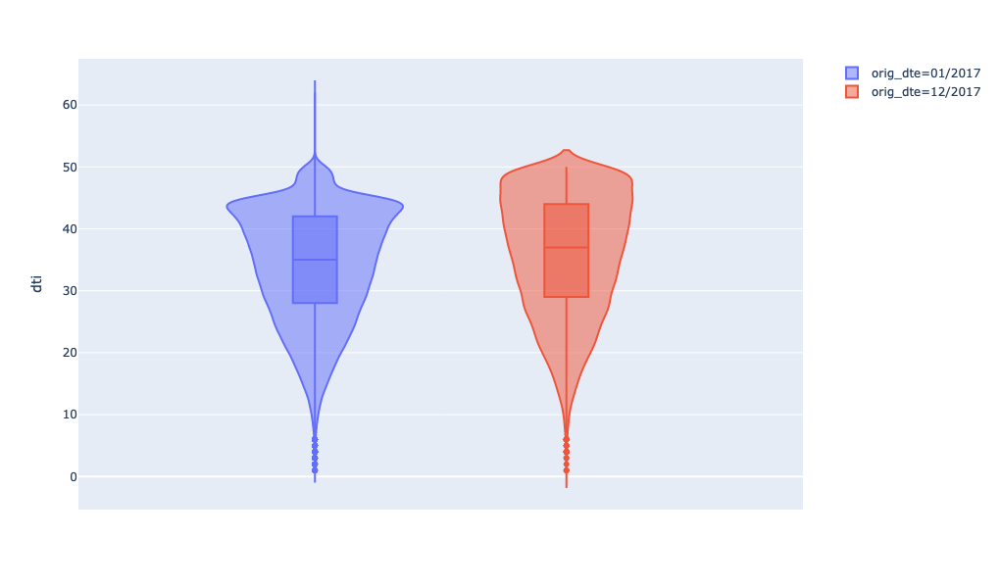

In [9]:
# creating a violin chart of DTIs by origination date using plotly express
px.violin(
    data_frame = dti_df, 
    y = 'dti', 
    box = True,
    height = 600,
    width = 900, 
    color = 'orig_dte'
)

As we described above, now that we've explored and visualized some summary statistics, let's have a look at the fuller distribution of DTI. The violin plot gets at this in a way, but isn't the easiest to consume; for that, let's turn to some [probability density function plots](https://en.wikipedia.org/wiki/Probability_density_function), aka [a KDE plot](https://seaborn.pydata.org/generated/seaborn.kdeplot.html).

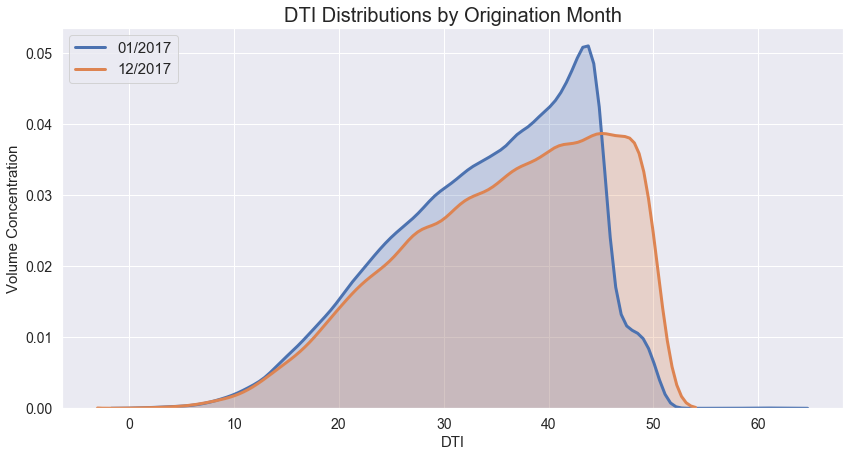

In [10]:
# building a KDE plot to compare DTI across the two origination months:

# setting our figure size
plt.figure(figsize=(14, 7))

# plotting one KDE plot for each origination month
for origination_date in dti_df['orig_dte'].unique() :
    dti_dist_ax = sns.distplot(
        dti_df.loc[dti_df['orig_dte'] == origination_date,'dti'],
        hist = False,
        kde = True,
        kde_kws = {
            'shade': True,
            'linewidth':3
        },
        label = origination_date
    )
;

# taking care of a few final aesthetic tweaks: 
# setting the axes labels and title
dti_dist_ax.set(
    xlabel = "DTI", 
    ylabel = "Volume Concentration", 
    title = "DTI Distributions by Origination Month"
)
# specifying the legend location and size, tweaking other font sizes, and displaying in-line
dti_dist_ax.legend(loc = 2, prop = {'size': 15})
dti_dist_ax.yaxis.label.set_size(15)
dti_dist_ax.xaxis.label.set_size(15)
dti_dist_ax.title.set_size(20)
plt.yticks(fontsize = 14)
plt.xticks(fontsize = 14)

# saving out the plot
plt.savefig(fname = '../media/dti_origmonth_dist_plot.png')

### Inferential Stats and Visualizations.

Now that we have gleaned some insights from our EDA, it's time to explore some statistical tests to better probe the differences between DTI in January vs. December 2017. But what kinds of tests should we apply? Generally speaking, there are two broad categories of tests that we might wish to use: [parametric vs. non-parametric tests](http://vassarstats.net/textbook/parametric.html). 

Because diving into the weeds of what statistical tests to use when is outside the scope of this class, suffice it to say that there are few that we might want to explore here. First, and perhaps most obviously, we might want to simply test if the mean DTI of the two distributions differs significantly. 

When testing the difference in means:

- A parametric test we could use would be [a t-test](http://www.stat.yale.edu/Courses/1997-98/101/meancomp.htm).
- A non-parametric way we could test this would be to use [bootstrap-resampling (aka Hacker Stats)](https://www.youtube.com/watch?v=Iq9DzN6mvYA).
    - This method arrives at the same answer as a t-test but using a simulation / bootstrap approach as opposed to a closed-form equation approach (i.e the parametric t-test); see the link for more info
- There are other (somewhat more niche) non-parametric tests that *might* sometimes work for this kind of problem (like the [Wilcoxon Test](https://www.investopedia.com/terms/w/wilcoxon-test.asp) and the [Mann-Whitney U Test](https://en.wikipedia.org/wiki/Mann%E2%80%93Whitney_U_test), but those have assumptions of their own as well, and we won't explore them here. If you're interested in learning more about these tests and others like them, the best place to start is with [the scipy stats documentation](https://scipy-lectures.org/packages/statistics/index.html).

**Note:** With a test like the t-test there are a series of [assumptions that we need to check first](https://www.investopedia.com/ask/answers/073115/what-assumptions-are-made-when-conducting-ttest.asp) before applying the test (i.e. assumptions of normality, homogenous variances, etc.). We'll start below by testing the key assumptions to see if we can use the t-test here at all. Given the distribution plots we've already seen, it's looking doubtful that these distributions are normal 'enough' for the test to work, but let's do our due diligence! 

- To test equal variances, we'll use the [Levene test from the `stats` library](https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.stats.levene.html).
    - The Levene test tests the null hypothesis that all input samples are from populations with equal variances. So if we see a very small p-value we can infer with decent confidence that the variances are *not* equal.
- To test for normality, we'll use the [Shapiro-Wilk test from the `stats` library](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.shapiro.html).
    - The Shapiro-Wilk test tests the null hypothesis that the data was drawn from a normal distribution. So if we see a very small p-value we can infer with decent confidence that the distributions are *not* normal.

In [11]:
# we'll start by cleaning our data slightly by dropping any NAs
dti_df_t = dti_df.dropna()
# then we'll make two vectors of just the DTI values from each of the two months
# this is purely for convenience as we run both vectors through some assumption tests 
jan2017_dtis = dti_df_t.loc[dti_df.orig_dte == '01/2017', 'dti']
dec2017_dtis = dti_df_t.loc[dti_df.orig_dte == '12/2017', 'dti']

In [12]:
# running all the assumption tests:

# homogeneity of variances is required for t-tests
print("Check for equal variances: " + str(stats.levene(jan2017_dtis, dec2017_dtis)))

# these two distros do not have homogeneity of variances
print("Check for normality: " + str(stats.shapiro(jan2017_dtis)))
print("Check for normality: " + str(stats.shapiro(dec2017_dtis)))

# running the t-test anyway, despite it's assumptions being violated
print("Results of t-test (even though assumptions fail): " + str(stats.ttest_ind(jan2017_dtis, dec2017_dtis)))

Check for equal variances: LeveneResult(statistic=364.1337154683792, pvalue=4.374068917592142e-81)
Check for normality: (0.9656326174736023, 0.0)
Check for normality: (0.9576224088668823, 0.0)
Results of t-test (even though assumptions fail): Ttest_indResult(statistic=-28.10645738472367, pvalue=2.189027962821834e-173)


From the above cell, we can see that some of the key assumptions behind the t-test fail us:

- we don't have homogenous variances
- we don't have normally distributed data

As such, we shouldn't rely on a t-test. We can, however, go the non-parametric route and test for the difference in means between the two distributions by making use of bootstrap resampling. If you're unfamiliar with these techniques, [check out this link here](https://stats.stackexchange.com/questions/136661/using-bootstrap-under-h0-to-perform-a-test-for-the-difference-of-two-means-repl), in addition to the other resource linked above. Let's dive in to this bootstrapping method below! 

In [13]:
# first, we need to construct a few convenience functions to help with the boostrap replicate creation:

def bootstrap_replicate_1d(data, func, n_obs_to_sample=100):
    """Generate boostrap replicate of 1-Dimension data given
    a series, a function for which to retrieve a replicate (for
    example np.mean), and the number of observations to sample."""
    
    # randomly draw numb_obs_to_sample observations (with replacement) from data
    bs_sample = np.random.choice(data, size = n_obs_to_sample, replace = True)
    
    # returns the result of the function chosen applied to the sampled observations
    return func(bs_sample)

def draw_bs_reps(data, func, n_obs_to_sample, n_reps_to_draw = 1):
    """Draw n_reps_to_draw bootstrap replicates using boostrap_replicate_1d."""

    # initialize empty array to store replicates: bs_replicates
    bs_replicates = np.empty(n_reps_to_draw)

    # generate and store i replicates
    for i in range(n_reps_to_draw):
        bs_replicates[i] = bootstrap_replicate_1d(data, func, n_obs_to_sample)

    # returns numpy array of all boostrap replicates drawn
    return bs_replicates

In [14]:
# take 10,000 bootstrap replicates of the mean of the DTI distribution for Jan and Dec 2017...
# 10k chosen rather arbitrarily as a sufficently large number for our purposes

# drawing n samples w/ replacement from Jan's DTI distro and taking the mean...
# where n is the number of observations in Jan; we do this 10k times (resulting in 10k means) 
jan_replicates = draw_bs_reps(
    data = jan2017_dtis, 
    func = np.mean, 
    n_obs_to_sample = len(jan2017_dtis), 
    n_reps_to_draw = 10_000
)

# drawing n samples w/ replacement from Dec's DTI distro and taking the mean...
# where n is the number of observations in Dec; we do this 10k times (resulting in 10k means) 
dec_replicates = draw_bs_reps(
    data = dec2017_dtis, 
    func = np.mean, 
    n_obs_to_sample = len(dec2017_dtis), 
    n_reps_to_draw = 10_000
)

Now we can take a look at the bootstrap replicate means that we've drawn. Each of the arrays below contain 10,000 observations: 10k boostrap replicates of the mean DTI for the respective origination month. 

In [15]:
# inspecting what our replicate means look like
print(jan_replicates)
print(dec_replicates)

[34.02730813 34.06247423 34.04072547 ... 34.10378771 34.1284307
 34.13098893]
[35.82933735 35.81234831 35.80315511 ... 35.79263808 35.83485328
 35.71221593]


In [16]:
# building a df to make it easier to handle our data
dti_bootstrap_replicate_means = pd.DataFrame(
    {
        'jan_dti_means':jan_replicates, 
        'dec_dti_means':dec_replicates
    }
)

In [17]:
# checking that we do in fact have 10k observations 
print(len(dti_bootstrap_replicate_means))

# inspecting our df of bootstrap replicate mean DTIs
dti_bootstrap_replicate_means.head()

10000


,jan_dti_means,dec_dti_means
0,34.027308,35.829337
1,34.062474,35.812348
2,34.040725,35.803155
3,34.061489,35.901522
4,34.035250,35.767081


Now that we have drawn 10,000 bootstrap replicates of the mean DTI from our two distributions, we'll calculate the difference between them so we can try to glean some information from the distribution of the differences in the mean. 

In [18]:
# adding a column for the difference in means
dti_bootstrap_replicate_means['difference_in_means'] = (
    dti_bootstrap_replicate_means['dec_dti_means'] - dti_bootstrap_replicate_means['jan_dti_means']
)

# inspecting our data
dti_bootstrap_replicate_means.head()

,jan_dti_means,dec_dti_means,difference_in_means
0,34.027308,35.829337,1.802029
1,34.062474,35.812348,1.749874
2,34.040725,35.803155,1.762430
3,34.061489,35.901522,1.840033
4,34.035250,35.767081,1.731831


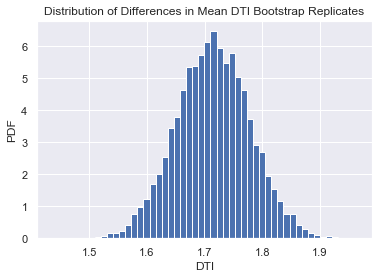

In [19]:
# make a histogram of the results for the difference in mean DTI between January and December 2017
plt.hist(dti_bootstrap_replicate_means['difference_in_means'], bins=50, density=True)
plt.xlabel("DTI")
plt.ylabel("PDF")
plt.title("Distribution of Differences in Mean DTI Bootstrap Replicates")

# show the plot
plt.show()

Looking at the chart above, we would say that our bootstrap resampling technique would lead us to believe that the difference in average DTI between January and December 2017 is positive with a high degree of certainty, and likely lies somewhere between 1.5 and 1.9 points of DTI. 

Still, we can make some additional statements about our confidence in the difference in mean DTI between our two populations, as shown below. 

In [20]:
# get the confidence bands based on our boostrapped replicates
# the percentiles below amount to our confidence interval bounds
conf_int = np.percentile(dti_bootstrap_replicate_means['difference_in_means'],[2.5,97.5])

# now we can print the confidence interval, with bounds rounded to nearest tenth
print(
    "The 95% confidence interval for the difference in mean DTI between the two distributions is between", 
    conf_int[0].round(1), "and", conf_int[1].round(1), "points of DTI."
)

The 95% confidence interval for the difference in mean DTI between the two distributions is between 1.6 and 1.8 points of DTI.


Now that we have looked into a couple different methods of testing to see if there is a significant difference between the mean DTIs of the two distributions, we can turn our attention to testing for more holistic distributional differences. What kinds of tests might we wish to explore?

There are a few tests that come to mind as possible, and the differences between them, when you might prefer one vs. the other, etc., are outside of the scope of this material. Suffice it to say we might want to consider tests like:

- the Anderson-Darling test [(link here)](https://en.wikipedia.org/wiki/Anderson%E2%80%93Darling_test)
- the Kolmogorov–Smirnov (KS) test [(link here)](https://en.wikipedia.org/wiki/Kolmogorov%E2%80%93Smirnov_test)
- others... [(link here)](https://www.itrcweb.org/gsmc-1/Content/GW%20Stats/5%20Methods%20in%20indiv%20Topics/5%206%20Distributional%20Tests.htm)

All that said, for the purpose of this example, I'm going to go with the KS test. The one main thing to note when using the KS test is that you might not get as much sensitivity out of this test when you are looking for differences concentrated in the tails of the distribution. Again, outside of the scope of this course, but [you can read more about that here](https://www.itl.nist.gov/div898/handbook/eda/section3/eda35g.htm). Also, if you are more familiar with R and/or would appreciate more information about when and how to apply the KS test, check out [this vignette I wrote up here](https://github.com/pmaji/data-science-toolkit/blob/master/hypothesis-tests/ks_test.md) on that subject.

A nice strength of the KS test is that it lends itself to a very convenient and easily-interpretable visualization. We've already seen [PDF charts](https://www.khanacademy.org/math/statistics-probability/random-variables-stats-library/random-variables-continuous/v/probability-density-functions), and the KS test is easy to visualize via [CDF charts](https://en.wikipedia.org/wiki/Cumulative_distribution_function). Essentially, if you have two distributions, the KS test statistic is the maximum vertical distance of separation between the two CDFs. 

If the above isn't quite clear yet, take a look at the chart produced below, which is essentially the cumulative version of the previously-seen PDF chart labeled: "DTI Distributions by Origination Month".

In [21]:
# see docstring for function info
def draw_ecdf_with_ks_stat(
    data_1, 
    data_2, 
    name1 = "data1", 
    name2 = "data2", 
    plot_title = "Comparing 2 CDFs for KS-Test", 
    print_ks_test_stat = True
):
    '''
    This function plots two CDFs and draws an arrow representing the KS test statistic. 
    
    Keyword arguments:
    data_1 -- the 1st numeric series to compare (default None)
    data_2 -- the 2nd numeric series to compare (default None)
    name1 -- the label associated with the data_1 series, to be used in plot (default "data1")
    name2 -- the label associated with the data_2 series, to be used in plot (default "data2")
    plot_title -- the title for the final plot (default "Comparing 2 CDFs for KS-Test")
    print_ks_test_stat -- logical for whether or not to print out the KS test stat when run (default True)
    '''
    
    plt.figure(figsize=(12, 7))
    # sort the two vectors of data to be compared to facilitate the cumulative calculation
    data_1 = np.sort(data_1)
    data_2 = np.sort(data_2)
    # this linspace represents the CDF--effectively the y data for our CDF plot
    # as you move up in y you capture a higher percentage of the data
    # thanks to the sort, when the value of `a` is, say, 40, we can say that...
    # 40% of our data has a value (in this case DTI) at or below the corresponding value in data_1, and so on
    a = np.linspace(0, 1, len(data_1), endpoint=False)
    b = np.linspace(0, 1, len(data_2), endpoint=False)
    
    # creating a helpful dataframe to store what will effectively be our x and y coords to make the cdf
    df_1 = pd.DataFrame(dict(x = data_1, y = a))
    df_2 = pd.DataFrame(dict(x = data_2, y = b))
    
    # setting up a loop to measure the distance between y values for each value of x... 
    # the problem is that, since my data are discrete, I have to guess what the actual values of x should be...
    # this is why I take the closest value of x
    distance_dict = {}
    curr_max = 0
    # for each x value, find the highest y value that appeared so far (this works b/c our data are sorted)
    for x_val in set(df_1.x):
        y1 = max(df_1[df_1.x <= x_val].y)
        y2 = max(df_2[df_2.x <= x_val].y)
        # find the distance between the cdfs at this point in the loop over x...
        # because recall: the KS test stat is the max distance between the two cdfs
        distance = abs(y1-y2)
        # log the magnitude of the distance between the cdfs (distance), as well as the x_val and lowest y
        distance_dict[x_val] = (distance, x_val, min(y1,y2))
        # update the current maximum distance (i.e. what we think the KS test stat might be at this stage)
        curr_max = max(curr_max, distance)
    
    final_coord = (0,0)
    # loop over all stored valuesin the distance dictionnary...
    # when we hit the maximum distance (i.e. the KS test stat)...
    # take the x and y vals from the dictionnary and assign that to our final coordinates
    for v in distance_dict.values():
        if v[0] == curr_max:
            final_coord = (v[1], v[2])
    
    # making a red arrow that will signifiy the KS test statistic...
    # stretching between the two cdfs at the point of their max separation
    plt.arrow(
        final_coord[0], final_coord[1], dx = 0, dy = ((4/5) * curr_max), shape = 'full', color = 'red', 
        head_length = (curr_max / 5), length_includes_head = False, width = (curr_max / .5)
    )
    plt.arrow(
        final_coord[0], (final_coord[1] + curr_max), dx = 0, dy = -((4/5) * curr_max), shape = 'full', color = 'red', 
        head_length = (curr_max / 5),length_includes_head = False, width = (curr_max / .5)
    )
    
    # prints out the estimate of the KS test statistic unless silenced by the function parameter
    if print_ks_test_stat:
        print("The approximate KS test statistic for these two series is: " + str(curr_max))
    
    # plots the x and y data for the cdfs
    plt.plot(data_1, a)
    plt.plot(data_2, b)
    # adds a legend 
    plt.legend([name1, name2])
    # specifies the plot title
    plt.title(plot_title)
    # outputs the plot in-line
    plt.show();

The approximate KS test statistic for these two series is: 0.13748304820850377


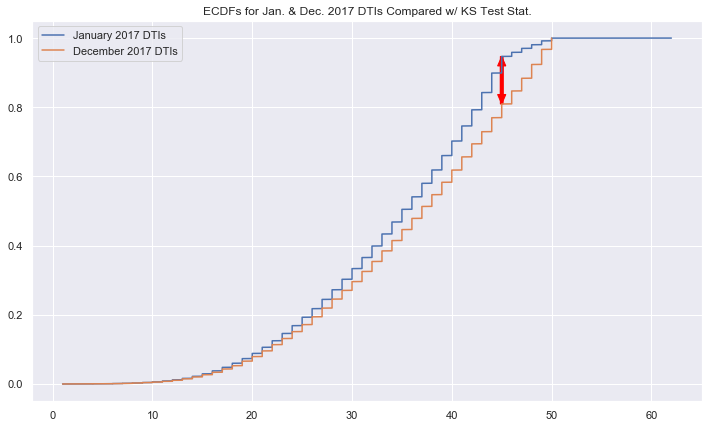

In [22]:
# calls the function created above to draw the ECDFs for our two DTI distros and draw the KS test statistic 
draw_ecdf_with_ks_stat(
    data_1 = jan2017_dtis, 
    data_2 = dec2017_dtis, 
    name1 = "January 2017 DTIs", 
    name2 = "December 2017 DTIs",
    plot_title = "ECDFs for Jan. & Dec. 2017 DTIs Compared w/ KS Test Stat.",
    print_ks_test_stat = True
)

In the chart above we can see that there does appear to be a non-neglibile difference between the two CDFs, with the greatest point of separation occuring around 45 on the x-axis. How interesting! If you want to know more about why this is perfectly intuitive from a business perspective, check out [this article here](https://www.creditkarma.com/home-loans/i/debt-to-income-ratio-increase/) describing some mid-2017 changes to DTI that are likely behind the importance of this 45 breakpoint. 

Even if from the previously-seen PDF, as well as the two CDFs in the chart above, there does appear to be a distributional difference, what does the KS test itself tell us? Let's run the [`ks_2samp` test from the `stats` package](https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.stats.ks_2samp.html) below to test the null hypothesis that these two series were drawn from the same distribution. 

In [23]:
# running the KS test to test the null hypothesis that these two series are from the same distribution
stats.ks_2samp(jan2017_dtis, dec2017_dtis)

Ks_2sampResult(statistic=0.13745391189345235, pvalue=0.0)

The results above indicate that we can reject the null hypothesis that these two series were drawn from the same distribution with a high degree of certainty, as we have a relatively high KS test statistic (*note how close this statistic is to the one we calculated in the chart above!*), as well as a very low p-value (rounded to 0). It would appear that these two distributions are in fact quite different overall!

**When ready for the next section of content, proceed to `part_3_main_nb.ipynb`**